# SC1003 Mini Project - Team Allocation Simulator

**FCE4, Team 5**

*Tan Choon Yang*

*Tan Wei Yong*

*Wee Kai Yi*

*Wai Yan Min Ko Ko*
<br><br>

**Team Allocation Simulator**

The "Team Allocation Simulator" is designed to solve the challenge of forming diverse and balanced teams from a large student population enrolled in the "Introduction to Data Science" course. Given the `records.csv` dataset of 6,000 students, our goal is to first create teams of five, before allowing the user to choose the number of students per group/team (`students_per_group`) between 4 - 10 students. The algorithm will ensure diversity in terms of school affiliation, gender, and CGPA with it being the main focus.
<br><br>
Throughout this project, we utilized computational thinking principles and Python programming to analyze the data and allocate teams fairly. In this report, we will walk through the various stages of the project, including importing necessary libraries and the dataset, analyzing the student data, designing the team allocation algorithm and evaluating the output data from the algorithm.

## Import Python Libraries
To develop the Team Allocation Simulator, we utilize essential Python libraries, strictly adhering to the requirement of not using advanced data manipulation libraries like numpy or pandas. Here’s a breakdown of the libraries imported and their respective roles in the project:
<br>

**Data Analysis Libraries**:
- `matplotlib.pyplot`: This library is primarily used for creating various visualizations, such as pie charts, bar charts, and histograms, which help in analyzing the student data (e.g., gender distribution, school representation, CGPA spread).
- `seaborn`: Built on top of matplotlib, seaborn enhances our data visualizations by adding statistical graphics. It assists in generating clear and aesthetically pleasing charts to support the data analysis phase.
- `random`: This library provides controlled randomness, which is useful for random selections and placements within the algorithm while ensuring fair distribution of student attributes.
<br><br>

**User Interactive Libraries**:
- `ipywidgets`: This library enables interactive HTML widgets within Jupyter notebooks, allowing users to engage with the algorithm in real-time.
- `interact` (from ipywidgets): This function is used to create interactive user interfaces, such as sliders for selecting team sizes. It makes the notebook more user-friendly by allowing dynamic adjustment of parameters.
- `IPython.display.display`: Used to display widgets and other output elements directly within the Jupyter notebook, enhancing interactivity and improving the visualization of data and results.
<br><br>
These libraries allow us to handle data visualization, randomness in team allocations, and interactive components, creating a balanced, user-centric approach to analyzing and processing the data.

In [1]:
# Data Analysis Libraries
import matplotlib.pyplot as plt  # Used for creating visualizations to analyze and evaluate data
import seaborn as sns  # Used for making statistical graphics in Python to support matplotlib
import random  # Used for selecting controlled random data in the algorithm
from math import ceil  # Used for rounding up the decimal values to the nearest integer

# User Interactive Libraries
import ipywidgets as widgets  # Used for creating interactive HTML widgets for Jupyter notebooks and IPython
from ipywidgets import interact  # Used for creating interactive user interfaces in Jupyter notebooks
from IPython.display import display  # Used for displaying widgets and other outputs in Jupyter notebooks

## Import records.csv file from my Github Repository (for Google Colab, without Using Panda)
**Run this Code snippet when using Google Colab**
<br>
For the sake of convenience and importing file errors, when running the notebook, the dataset records.csv is hosted on Wai Yan's GitHub repository, allowing easy access and seamless sharing with team members. Importing the file directly from GitHub ensures that data is imported, without the need for manual downloading or updating into all of our Python Environment.

In [2]:
import requests # Used for sending HTTP requests to the web and receiving responses

# Step 1: Download the CSV data
url = 'https://github.com/waiyanminkoko/SC1003-Mini-Project-Team-Allocation-Simulator-/blob/fd7c061d9d3636f1bef7e4a266510c23e89357c5/records.csv?raw=true'
response = requests.get(url)

if response.status_code == 200:
  db = response.content.decode('utf-8')
  # Step 2: Read the CSV data manually
  lines = db.split('\n') # Split the CSV data into lines
  # Data Extraction
  headers = [header.strip() for header in lines[0].split(',')]  # Extract the headers
  data = [line.strip().split(',') for line in lines[1:] if line.strip()] # Extract the data
  
  # Convert to a list of dictionaries for easier analysis
  db = [dict(zip(headers, [value.strip() for value in row])) for row in data]
  print(db[:5])  # Display the first few rows of the data
else:
  print("Error downloading file.")


[{'Tutorial Group': 'G-1', 'Student ID': '5002', 'School': 'CCDS', 'Name': 'Aarav Singh', 'Gender': 'Male', 'CGPA': '4.02'}, {'Tutorial Group': 'G-1', 'Student ID': '3838', 'School': 'EEE', 'Name': 'Aarti Nair', 'Gender': 'Female', 'CGPA': '4.05'}, {'Tutorial Group': 'G-1', 'Student ID': '2091', 'School': 'EEE', 'Name': 'Adlan Bin Rahman', 'Gender': 'Male', 'CGPA': '4.2'}, {'Tutorial Group': 'G-1', 'Student ID': '288', 'School': 'CoB (NBS)', 'Name': 'Ajay Verma', 'Gender': 'Male', 'CGPA': '4.01'}, {'Tutorial Group': 'G-1', 'Student ID': '4479', 'School': 'CCDS', 'Name': 'Amelia Kim', 'Gender': 'Female', 'CGPA': '4.11'}]


## Import records.csv files from the assets folder (To Run Locally)
**Run this Code snippet when running this python notebook locally with records.csv in the "assets" folder after creating your python environment.**
<br>

**Don't run this if you are using the notebook in Google Colab**

To ensure this notebook can be run locally on our respective python environment or without access to the internet, we also enable the dataset to be imported from the local `assets` folder as per the project requirement. This ensures that the project is versatile and can be run both locally and remotely. 
<br>

Since the use of `csv` library is not recommened for this project, the data in the `records.csv` file is read manually with the headers and data extracted into `headers` and `lines` before combining them back into the `data` list. The student data in the `data` list is then converted into the `db` dictionary for easier analysis.

In [3]:
# records.csv is a CSV file located in the assets folder of the repository.
# The CSV file contains the following columns: Tutorial Group, Student ID, School, Name, Gender, CGPA

with open('assets/records.csv', 'r') as file:
    data = file.readlines()
    # Read the CSV data manually
    lines = data # temporary store the data in a variable for easier access and manipulation later
    headers = lines[0].strip().split(',') # extract the headers from the first line of the data, these will be the keys for the dictionaries
    # extract the data from the remaining lines of the data, these will be the values for the dictionaries
    data = [
        line.strip().split(',') # split the line into a list of values
        for line in lines[1:] if line.strip() # ignore empty lines
    ] 

    # Convert to a list of dictionaries for easier analysis
    db = [dict(zip(headers, row)) for row in data] # create a dictionary for each row of data
    
print(db[:5])  # Display the first few rows of the data

[{'Tutorial Group': 'G-1', 'Student ID': '5002', 'School': 'CCDS', 'Name': 'Aarav Singh', 'Gender': 'Male', 'CGPA': '4.02'}, {'Tutorial Group': 'G-1', 'Student ID': '3838', 'School': 'EEE', 'Name': 'Aarti Nair', 'Gender': 'Female', 'CGPA': '4.05'}, {'Tutorial Group': 'G-1', 'Student ID': '2091', 'School': 'EEE', 'Name': 'Adlan Bin Rahman', 'Gender': 'Male', 'CGPA': '4.2'}, {'Tutorial Group': 'G-1', 'Student ID': '288', 'School': 'CoB (NBS)', 'Name': 'Ajay Verma', 'Gender': 'Male', 'CGPA': '4.01'}, {'Tutorial Group': 'G-1', 'Student ID': '4479', 'School': 'CCDS', 'Name': 'Amelia Kim', 'Gender': 'Female', 'CGPA': '4.11'}]


## Analyzing records.csv data (Using Matlab)

**Analyzed Data**: Gender, School, GPA, Tutorial Groups
<br>

Before proceeding to the team formation algorithm, we analyze the student data to better understand the student population. This analysis helps us visualize key factors such as *Gender* distribution, *School* affiliation, *CGPA*, and the number of *Tutorial Groups* which will guide the logic for team formation. By understanding these distributions, we can tailor the algorithm to achieve fair and diverse teams.
<br><br>
Visualizations are created using `matplotlib`, and the results provide a foundation for how the algorithm should handle grouping.

### Gender
**Piechart of Male vs Female with Percentage**
<br>
A pie chart is generated to visualize the gender distribution among the 6,000 students. This helps us understand whether we are dealing with a predominantly male, female, or balanced population. Since the team formation requires gender diversity, it is essential to know if we need to take extra steps to balance this attribute across teams.
<br><br>
This visualization shows that the gender ratio is slightly female dominant, allowing us to expect certain teams with more female students in a team compared to male students.

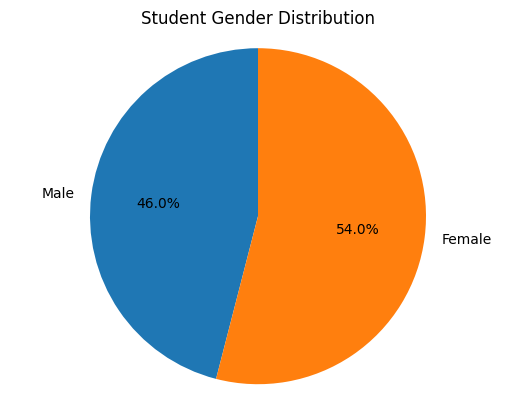

In [4]:
# Count the number of instances of "Male" and "Female" in the records.csv file
gender_counts = {'Male': 0, 'Female': 0}
for record in db:
    # take note of the gender value inside the db, under the "Gender" Column
    gender = record['Gender']
    # if the value ("Male", "Female" value can be found inside the gender_count dictionary)
    if gender in gender_counts:
        gender_counts[gender] += 1 # increment the respective value of "Male" / "Female" by 1

# Create the pie chart
plt.pie(gender_counts.values(), labels=gender_counts.keys(), autopct='%1.1f%%', startangle=90) # display the percentage of gender in a pie chart

# Title of the pie chart
plt.title('Student Gender Distribution')

# Ensure the circle's proportion
plt.axis('equal')

# Display the chart
plt.show()

### School
**Bar chart of number of students in each school**

A bar chart is plotted to visualize how many students are coming from each school. This is important for ensuring that no single team has a majority from the same school, as diverse academic backgrounds foster a broader range of skills and knowledge in teams.

From the chart, we can see that there are more students in CCDS, EEE & CoB (NBS) with more than 700 students from each school, compared to the other schools. We also found that there is 1 student from HASS who will be placed in a team with other schools. While these schools are more represented than others, there is enough variety across schools to achieve balanced overall teams.

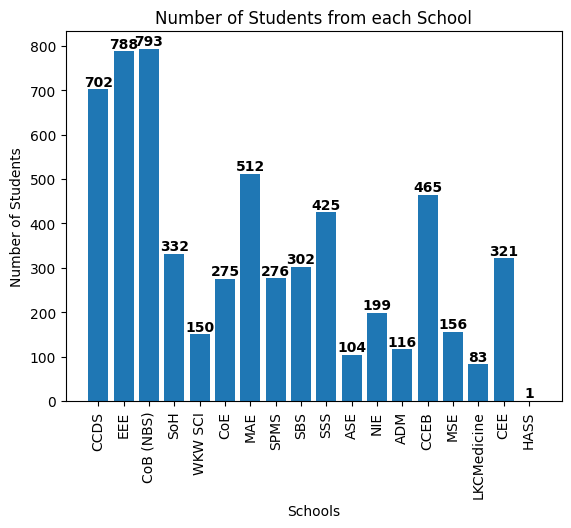

In [5]:
# Count the number of instances the individual value in "School" appears in the records.csv file
school_counts = {} # Dictionary to add in the Schools and the number of instances the school appears in the table
for record in db:
  school = record['School'] # refer to the value under the "School" column
  # if the school can be found inside the school_counts' dictionary
  if school in school_counts:
    school_counts[school] += 1 # increment the value of its instances (value) by 1
  # if the school cannot be found inside the school_counts dictionary
  else:
    school_counts[school] = 1 # add the school into the dictionary and initialise the value as 1

# Create lists for schools and their counts for plotting
schools = list(school_counts.keys())
counts = list(school_counts.values())

# Create the bar chart using matplotlib
plt.bar(schools, counts)

# Display the number of students on top of each bar
for i, v in enumerate(counts):
    plt.text(i, v + 1, str(v), ha='center', va='bottom', fontweight='bold')

# Title of the bar chart
plt.title('Number of Students from each School')

# Labels to the x and y axis
plt.xlabel('Schools')
plt.ylabel('Number of Students')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Display the chart
plt.show()

### Pie chart Distribution of the School

A pie chart further breaks down the school distribution, providing a clearer view of the proportional representation of each school within the course. This helps identify if any particular school dominates the dataset, which would require careful consideration during team formation to maintain diversity.

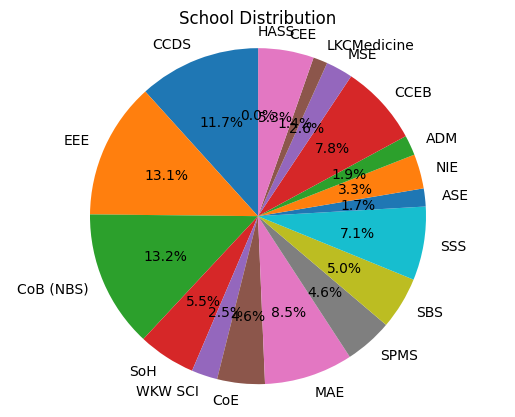

In [6]:
# Create the pie chart
plt.pie(school_counts.values(), labels=school_counts.keys(), autopct='%1.1f%%', startangle=90) # display the percentage of gender in a pie chart

# Title of the pie chart
plt.title('School Distribution')

# Ensure the circle's proportion
plt.axis('equal')

# Display the chart
plt.show()

### CGPA
**Histogram of all the Students' CGPA**

A histogram of the CGPA data is plotted to visualize the academic performance distribution of the students. This analysis is crucial because the teams should be balanced in terms of academic abilities, ensuring that no team is dominated by either high or low CGPA students.

The histogram reveals that the CGPAs follow a roughly normal distribution with majority of the students having a CGPA between 3.8 and 4.3. This helps inform the grouping algorithm to distribute students with varying academic performance levels fairly.

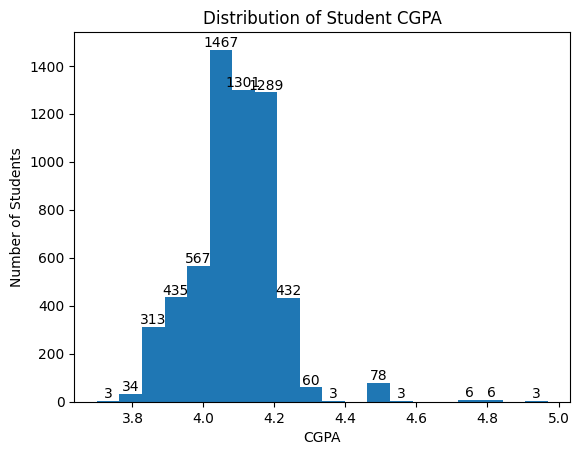

Minimum CGPA: 3.7
Maximum CGPA: 4.97
Standard Deviation of CGPA: 0.12


In [7]:
# counts = count the number of bins
# bins = the intervals of numeric values that each bar covers
# patches = objects that represent individual bins

# Extract CGPA values from the db list of dictionaries
cgpa_values = [float(record['CGPA']) for record in db]

# Create the histogram and get the counts and bin edges (a boundary that defines the edges of a bin in a histogram)
counts, bins, patches = plt.hist(cgpa_values, bins=20)

# Title
plt.title('Distribution of Student CGPA')

# Labels to the x and y axis
plt.xlabel('CGPA')
plt.ylabel('Number of Students')

# Count labels to each bar
for count, patch in zip(counts, patches):
  if count != 0:  # if there is any value in the bin
    plt.text(patch.get_x() + patch.get_width() / 2, count, int(count), ha='center', va='bottom')

# Display the chart
plt.show()

# Display the minimum and maximum CGPA values
min_cgpa = min(cgpa_values)
max_cgpa = max(cgpa_values)
print(f'Minimum CGPA: {min_cgpa}')
print(f'Maximum CGPA: {max_cgpa}')

# Calculate the mean CGPA
mean_cgpa = sum(cgpa_values) / len(cgpa_values)

# Calculate the variance
variance = sum((x - mean_cgpa) ** 2 for x in cgpa_values) / len(cgpa_values)

# Calculate the standard deviation
std_deviation = variance ** 0.5

print(f'Standard Deviation of CGPA: {std_deviation:.2f}')

#### Interactive Histogram
Slider is used to change the number of bins to be displayed in the histogram (min=5, max=50)

In [8]:
# Function to plot the histogram based on the number of bins
def plot_histogram(bin_count):
    # Extract CGPA values from the db list of dictionaries
    cgpa_values = [float(record['CGPA']) for record in db]

    counts, bins, patches = plt.hist(cgpa_values, bins=bin_count)

    # Title
    plt.title('Distribution of Student CGPA')

    # Labels for x and y axis
    plt.xlabel('CGPA')
    plt.ylabel('Number of Students')

    # Count labels for each bar
    for count, patch in zip(counts, patches):
        if count != 0: # if there is any value in the bin
            plt.text(patch.get_x() + patch.get_width() / 2, count, int(count), ha='center', va='bottom')

    # Display the chart
    plt.show()

# Create the interactive slider
interact(plot_histogram, bin_count=widgets.IntSlider(min=5, max=50, step=1, value=20))

# Display the minimum and maximum CGPA values
min_cgpa = min(cgpa_values)
max_cgpa = max(cgpa_values)
print(f'Minimum CGPA: {min_cgpa}')
print(f'Maximum CGPA: {max_cgpa}')

# Calculate the mean CGPA
mean_cgpa = sum(cgpa_values) / len(cgpa_values)

# Calculate the variance
variance = sum((x - mean_cgpa) ** 2 for x in cgpa_values) / len(cgpa_values)

# Calculate the standard deviation
std_deviation = variance ** 0.5

print(f'Standard Deviation of CGPA: {std_deviation:.2f}')


interactive(children=(IntSlider(value=20, description='bin_count', max=50, min=5), Output()), _dom_classes=('w…

Minimum CGPA: 3.7
Maximum CGPA: 4.97
Standard Deviation of CGPA: 0.12


### Tutorial Groups
**Number of students in each Tutorial Group**

Lastly, we check the number of students in each tutorial group to verify that the data is consistent and that each group has the expected number of students. Since teams will be formed within tutorial groups, this step ensures that the tutorial groups are balanced and ready for team allocation.

The analysis confirms that each tutorial group has **50 students**, as expected, which allows us to proceed confidently to the next phase of the project.

In [9]:
# Count the number of students in each Tutorial Group and add them into the dictionary
tutorial_group_counts = {} # Dictionary to add the Tutorial Groups and the number of students in each Tutorial Groups
for record in db:
    tutorial_group = record['Tutorial Group'] # Collect the tutorial groups and the number of students per group
    # if the tutorial group exist in the dictionary
    if tutorial_group in tutorial_group_counts:
        tutorial_group_counts[tutorial_group] += 1 # increment the number of students by 1
    # if the tutorial group does not exist in the group
    else:
        tutorial_group_counts[tutorial_group] = 1 # initialise the tutorial group by 1 and add it into the dictionary

# Print the Dictionary
print(tutorial_group_counts)

{'G-1': 50, 'G-10': 50, 'G-100': 50, 'G-101': 50, 'G-102': 50, 'G-103': 50, 'G-104': 50, 'G-105': 50, 'G-106': 50, 'G-107': 50, 'G-108': 50, 'G-109': 50, 'G-11': 50, 'G-110': 50, 'G-111': 50, 'G-112': 50, 'G-113': 50, 'G-114': 50, 'G-115': 50, 'G-116': 50, 'G-117': 50, 'G-118': 50, 'G-119': 50, 'G-12': 50, 'G-120': 50, 'G-13': 50, 'G-14': 50, 'G-15': 50, 'G-16': 50, 'G-17': 50, 'G-18': 50, 'G-19': 50, 'G-2': 50, 'G-20': 50, 'G-21': 50, 'G-22': 50, 'G-23': 50, 'G-24': 50, 'G-25': 50, 'G-26': 50, 'G-27': 50, 'G-28': 50, 'G-29': 50, 'G-3': 50, 'G-30': 50, 'G-31': 50, 'G-32': 50, 'G-33': 50, 'G-34': 50, 'G-35': 50, 'G-36': 50, 'G-37': 50, 'G-38': 50, 'G-39': 50, 'G-4': 50, 'G-40': 50, 'G-41': 50, 'G-42': 50, 'G-43': 50, 'G-44': 50, 'G-45': 50, 'G-46': 50, 'G-47': 50, 'G-48': 50, 'G-49': 50, 'G-5': 50, 'G-50': 50, 'G-51': 50, 'G-52': 50, 'G-53': 50, 'G-54': 50, 'G-55': 50, 'G-56': 50, 'G-57': 50, 'G-58': 50, 'G-59': 50, 'G-6': 50, 'G-60': 50, 'G-61': 50, 'G-62': 50, 'G-63': 50, 'G-64': 50, 

## Algorithm to split the Students into Groups (Basic + Enhanced)
This section describes the algorithm developed to allocate students into balanced, diverse teams of the `students_per_group` given by the user, based on specific criteria for fairness and inclusivity. Given the large dataset, we focused on grouping by Tutorial Group and then ensuring diversity across School Affiliation, Gender, and CGPA (Main Focus). The following steps outline the requirements and logic implemented to achieve this.
<br>

**Requirements**
<br>
The team allocation algorithm aims to create balanced groups by considering:
- *School Affiliation*: To prevent one-sided teams, we aim to avoid a majority of students from the same school within any team.
- *Gender*: To promote inclusivity, each team is formed to avoid a majority gender, ensuring representation.
- *CGPA*: To balance academic performance, each team should avoid predominance of students with very high or very low CGPA values.


These requirements ensure a fair representation of knowledge, skills, and perspectives, which will contribute to a collaborative learning environment.

**Algorithm Plan**
<br>
To achieve the above criteria, we designed a structured approach, including grouping, forming, and verifying team diversity.

1. **Group Students by Attributes**
- *User-Defined Team Size*: Using an interactive slider, the user can specify the number of students per team, allowing for flexibility in team size.

- *Initialize Containers*: An empty dictionary is initialized to hold team compositions, organizing students by Tutorial Group to ensure team members are assigned only within their respective groups.

- *Organize by Tutorial Group*: Using the student records, a dictionary is created where each key represents a Tutorial Group, mapping to a list of students within that group.

- *Sort by CGPA*: For balanced performance, students within each Tutorial Group are sorted by CGPA. They are then split into three categories within the Tutorial Group dictionary:

  - `cgpa_high`: Students with high CGPAs.
  - `cgpa_median`: Students who are not in the high and low CGPAs group (the bulk of students fall here).
  - `cgpa_low`: Students with low CGPAs.


This sorting allows us to control academic diversity when forming each team.

2. **Form Teams**
  - *Team Allocation by Diversity*: Once sorted, the algorithm iterates through each Tutorial Group, assigning students to teams based on:
  - *Gender Diversity*: Teams are formed with alternating genders where possible to ensure a balanced gender ratio.
  - *School Diversity*: Students from different schools are distributed across teams to avoid dominance by any single school.
  - *Academic Performance (CGPA)*: Each team includes students from different CGPA categories (high, median, low) to ensure balanced performance levels.


3. **Check Diversity**
- *Diversity Verification*: After initial allocation, the algorithm verifies if each team meets the diversity criteria. The critera includes percentage of gender majority in a team, max number of students from the same school and average GPA difference across the teams. The values can be fine-tuned in order to produce the best result that fits the criteria.
- *Reassignment for Balance*: If any team fails to meet the diversity requirements (school, gender, or cgpa), students are reassigned as needed to improve diversity within each team.


This structured approach ensures that the teams are as balanced as possible, achieving the intended fairness across attributes without compromising the requirement to work within each student's Tutorial Group.

**Requirements**
<br>
The application must ensure fairness and diversity when forming teams by considering the following factors:
<br>
1. School Affiliation: To ensure a mix of knowledge and skills, no team should have a majority of students from the same school.
<br>
2. Gender: To promote gender diversity, no team should have a majority of students from the same gender.
<br>
3. Current CGPA: To balance academic performance, teams should not consist predominantly of students with very high or very low CGPAs.
<br>

**Rough Plan**


*Group Students by Attribute*
- Initialize an empty list/dictionary to store the teams.
- Students must be from the same Tutorial Group hence create a dictionary to group them accordingly.
- Using the dictionary of each Tutorial Group, Sort students by CGPA to facilitate balanced distribution and split them into 3 dictionaries `cgpa_high`, `cgpa_median` (the rest of the students, considered our median), `cgpa_low` within the same tutorial group dictionary.
<br>

*Form Team*
- Iterate through the sorted student records and assign students to teams based on the diversity criteria (Gender -> School -> GPA).
- Ensure that each team has the number of students based on the user-input.
<br>

*Check Diversity*
- If a team does not meet the diversity criteria, reassign students as necessary.

This section describes the algorithm developed to allocate students into balanced, diverse teams of the `students_per_group` given by the user, based on specific criteria for fairness and inclusivity. Given the large dataset, we focused on grouping by Tutorial Group and then ensuring diversity across School Affiliation, Gender, and CGPA (Main Focus). The following steps outline the requirements and logic implemented to achieve this.
<br>

**Requirements**
<br>
The team allocation algorithm aims to create balanced groups by considering:
- *School Affiliation*: To prevent one-sided teams, we aim to avoid a majority of students from the same school within any team.
- *Gender*: To promote inclusivity, each team is formed to avoid a majority gender, ensuring representation.
- *CGPA*: To balance academic performance, each team should avoid predominance of students with very high or very low CGPA values.


These requirements ensure a fair representation of knowledge, skills, and perspectives, which will contribute to a collaborative learning environment.

**Algorithm Plan**
<br>
To achieve the above criteria, we designed a structured approach, including grouping, forming, and verifying team diversity.

1. **Group Students by Attributes**
- *User-Defined Team Size*: Using an interactive slider, the user can specify the number of students per team, allowing for flexibility in team size.

- *Initialize Containers*: An empty dictionary is initialized to hold team compositions, organizing students by Tutorial Group to ensure team members are assigned only within their respective groups.

- *Organize by Tutorial Group*: Using the student records, a dictionary is created where each key represents a Tutorial Group, mapping to a list of students within that group.

- *Sort by CGPA*: For balanced performance, students within each Tutorial Group are sorted by CGPA. They are then split into three categories within the Tutorial Group dictionary:

  - `cgpa_high`: Students with high CGPAs.
  - `cgpa_median`: Students who are not in the high and low CGPAs group (the bulk of students fall here).
  - `cgpa_low`: Students with low CGPAs.


This sorting allows us to control academic diversity when forming each team.

2. **Form Teams**
  - *Team Allocation by Diversity*: Once sorted, the algorithm iterates through each Tutorial Group, assigning students to teams based on:
  - *Gender Diversity*: Teams are formed with alternating genders where possible to ensure a balanced gender ratio.
  - *School Diversity*: Students from different schools are distributed across teams to avoid dominance by any single school.
  - *Academic Performance (CGPA)*: Each team includes students from different CGPA categories (high, median, low) to ensure balanced performance levels.


3. **Check Diversity**
- *Diversity Verification*: After initial allocation, the algorithm verifies if each team meets the diversity criteria. The critera includes percentage of gender majority in a team, max number of students from the same school and average GPA difference across the teams. The values can be fine-tuned in order to produce the best result that fits the criteria.
- *Reassignment for Balance*: If any team fails to meet the diversity requirements (school, gender, or cgpa), students are reassigned as needed to improve diversity within each team.


This structured approach ensures that the teams are as balanced as possible, achieving the intended fairness across attributes without compromising the requirement to work within each student's Tutorial Group.

## Algorithm (Basic + Enhanced)
<!-- **DRAFT (1st Discussion)**
5 per group (changeable)
<br>
**GPA**
- Check average of each tutorial group
- Group the teams in a way so that their average CGPA is within a range (Total Group GPA / number of students *(+-0.8)[to be changed])
- If the number of students in a group is not divisible by the tutorial group size, add the extra student into an existing group which has a lower (add the higher GPA student) /higher (add the lower GPA student) average GPA.
<br>
<br>

**School**
- Max 60% [to be changed] from the same school
After assigning the member into the group if the person's school is the same as 3 other members in the group (for groups of 5), assign a different person from a different school.
<br>
<br>

**Gender: Male & Female**
- Calculate the percentage of male vs female. Based on the the ratio of male:female the group assignment should follow a similar ratio.
<br>
<br>

Data Structure
- Input: Dictionary (db) {(column: value, column:value)] (Example - {("Tutorial Group": "G-1", "Name": "Tom", "School": "CCDS","GPA": "4.2")}
- Output: Dictionary { [{'Team Assigned': 1, +Student Details}, {'Team Assigned': 2+Student Details}] } -->



### Select Number of Students per Group (Pywidget Slider)

In [10]:
# Create a slider widget to select number of students per group
students_per_team_slider = widgets.IntSlider(
    value=5,              # Default value
    min=4,                # Minimum value (4 students)
    max=10,               # Maximum value (10 students)
    step=1,               # Increment steps
    description='Students per Team:',
    style={'description_width': 'initial'}
)

# Function to display the value of the slider
def display_students_per_team(change):
    global students_per_team
    students_per_team = change['new']
    print(f'Updated number of students per team: {students_per_team}')

# Set the initial value
students_per_team = students_per_team_slider.value

# Attach the function to the slider value change event
students_per_team_slider.observe(display_students_per_team, names='value')

# Display the slider widget
display(students_per_team_slider)

IntSlider(value=5, description='Students per Team:', max=10, min=4, style=SliderStyle(description_width='initi…

### Select the Settings for School, Gender and CGPA Variation.

`school_vary`: a threshold that determines the acceptable level of school diversity within a team.

Lower `school_vary` Value: A lower threshold means that even a small number of unique schools will be considered sufficient for diversity. This makes the school diversity check less stringent.

Higher `school_vary` Value: A higher threshold requires a greater number of unique schools to be represented before the team is considered diverse. This makes the school diversity check more stringent.

`gender_vary`: a threshold that determines the acceptable level of gender diversity within a team, to ensure that no single gender dominates the team, promoting a balanced representation of genders.

Lower `gender_vary` Value: A lower threshold means that even a slight imbalance in gender representation will be flagged as lacking diversity. This makes the gender diversity check more stringent.

Higher `gender_vary` Value: A higher threshold allows for a greater imbalance in gender representation before the team is flagged as lacking diversity. This makes the gender diversity check less stringent.

`cgpa_vary`: a threshold that determines the acceptable level of CGPA diversity within a team, based on the difference between the minimum and maximum median CGPA values across all teams in a tutorial group.

Lower `cgpa_vary` Value: A lower threshold means that even small differences between the minimum and maximum median CGPA values will be flagged as lacking diversity. This makes the CGPA diversity check more stringent.

Higher `cgpa_vary` Value: A higher threshold allows for greater differences between the minimum and maximum median CGPA values before the team is flagged as lacking diversity. This makes the CGPA diversity check less stringent.

In [11]:
# Function to calculate initial slider values based on students_per_team
def calculate_initial_slider_values(students_per_team):
    # Example logic to calculate initial values
    if students_per_team < 5:
        school_vary_initial = 0.1
        gender_vary_initial = 0.75
        cgpa_vary_initial = 0.5
    elif students_per_team == 5:
        school_vary_initial = 0.25
        gender_vary_initial = 0.6
        cgpa_vary_initial = 0.5
    elif students_per_team >= 6:
        school_vary_initial = 0.5
        gender_vary_initial = 0.6
        cgpa_vary_initial = 0.5
    return school_vary_initial, gender_vary_initial, cgpa_vary_initial

# Calculate initial slider values
school_vary_initial, gender_vary_initial, cgpa_vary_initial = calculate_initial_slider_values(students_per_team)

# Title Label using HTML widget
title_label = widgets.HTML(value="<h2 style='font-weight:bold; font-size:20px;'>Team Setting</h2>")

# Create a label to display the message
message_label = widgets.HTML(value="<i>(Rerun this code snippet when changing the number of students per team to see the calculated slider values.)</i>")

# Create a label to display the number of students per team
number_of_students_per_team_label = widgets.Label(value=f"Number of Students per Team: {students_per_team}")

# Create a label to display the initial and changed results of the Min Number of School
min_school_label = widgets.Label(value=f"Initial Min Number of School (Rnd up): {ceil(school_vary_initial*students_per_team)}")

# Create a label to display the initial and changed results of the Max Number of Students of the Same
max_gender_label = widgets.Label(value=f"Initial Max Number of Students of the Same Gender (Rnd up): {ceil(gender_vary_initial*students_per_team)}")

# Create a label to display the initial and changed results of the Allowable Median CGPA Range
allowable_median_cgpa_range_label = widgets.Label(value=f"Initial Allowable Median CGPA Range: {cgpa_vary_initial:.2f}")

# Create sliders for the vary settings
slider_layout = widgets.Layout(width='400px')  # Set a consistent width for sliders

school_vary_slider = widgets.FloatSlider(
    value=school_vary_initial,
    min=0.1,
    max=1.0,
    step=0.05,
    style={'description_width': 'initial'},
    layout=slider_layout
)

gender_vary_slider = widgets.FloatSlider(
    value=gender_vary_initial,
    min=0.1,
    max=1.0,
    step=0.05,
    style={'description_width': 'initial'},
    layout=slider_layout
)

cgpa_vary_slider = widgets.FloatSlider(
    value=cgpa_vary_initial,
    min=0.1,
    max=1.0,
    step=0.05,
    style={'description_width': 'initial'},
    layout=slider_layout
)

# Create bold labels for the descriptions
school_vary_label = widgets.HTML(value="<b>School Vary (%):</b>")
gender_vary_label = widgets.HTML(value="<b>Gender Vary (%):</b>")
cgpa_vary_label = widgets.HTML(value="<b>CGPA Vary:</b>")

# Combine the labels and sliders using HBox to view the description in bold and slider
school_vary_box = widgets.HBox([school_vary_label, school_vary_slider])
gender_vary_box = widgets.HBox([gender_vary_label, gender_vary_slider])
cgpa_vary_box = widgets.HBox([cgpa_vary_label, cgpa_vary_slider])

# Function to update the min_school_label based on school_vary_slider value
def update_min_school_label(change):
    min_students_from_same_school = school_vary_slider.value * students_per_team
    min_school_label.value = f"Min Number of Schools (Rnd up): {ceil(min_students_from_same_school)}"

def update_max_student_gender_label(change):
    max_students_of_same_gender = gender_vary_slider.value * students_per_team
    max_gender_label.value = f"Max Students of the Same gender (Rnd up): {ceil(max_students_of_same_gender)}"

def update_allowable_median_cgpa_label(change):
    allowable_median_cgpa_range = cgpa_vary_slider.value
    allowable_median_cgpa_range_label.value = f"Allowable Median CGPA Range: {(allowable_median_cgpa_range):.2f}"

# Attach the update function to the school_vary_slider value change event
school_vary_slider.observe(update_min_school_label, names='value')
gender_vary_slider.observe(update_max_student_gender_label, names='value')
cgpa_vary_slider.observe(update_allowable_median_cgpa_label, names='value')

# Function to display the current values of the sliders
def display_vary_settings(change):
    global school_vary, gender_vary, cgpa_vary
    school_vary = school_vary_slider.value
    gender_vary = gender_vary_slider.value
    cgpa_vary = cgpa_vary_slider.value
    print(f'School Vary: {school_vary:.2f}, Gender Vary: {gender_vary:.2f}, CGPA Vary: {cgpa_vary:.2f}')

# Attach the function to the sliders' value change event
school_vary_slider.observe(display_vary_settings, names='value')
gender_vary_slider.observe(display_vary_settings, names='value')
cgpa_vary_slider.observe(display_vary_settings, names='value')

# Create boxes with padding for better separation
box_layout = widgets.Layout(padding='10px 0px 10px 0px')

school_vary_box_with_label = widgets.VBox([school_vary_box, min_school_label], layout=box_layout)
gender_vary_box_with_label = widgets.VBox([gender_vary_box, max_gender_label], layout=box_layout)
cgpa_vary_box_with_label = widgets.VBox([cgpa_vary_box, allowable_median_cgpa_range_label], layout=box_layout)

# Display the sliders in a vertical box layout with spacing
display(widgets.VBox([
    title_label, 
    message_label, 
    number_of_students_per_team_label, 
    school_vary_box_with_label, 
    gender_vary_box_with_label, 
    cgpa_vary_box_with_label
]))

# Set initial values
school_vary = school_vary_slider.value
gender_vary = gender_vary_slider.value
cgpa_vary = cgpa_vary_slider.value

# Print initial values with two decimal places
print(f'School Vary: {school_vary:.2f}, Gender Vary: {gender_vary:.2f}, CGPA Vary: {cgpa_vary:.2f}')

School Vary: 0.25, Gender Vary: 0.60, CGPA Vary: 0.50


### Group Students by Attributes - Choon Yang
1. Initialize an empty dictionary: Create an empty dictionary tutorial_groups to store students grouped by their attributes.

2. Iterate through each student in the database: Loop through each student in the db list.

3. Group students by tutorial group:
- Extract the Tutorial Group of the current student.
- If the Tutorial Group is not already a key in tutorial_groups, add it with initial empty structures for schools, genders, and CGPA tiers.

<!--4. Group students by school:
- Extract the School of the current student.
- If the school is not already a key in the schools dictionary for the current tutorial group, add it with an empty list.
- Append the current student to the list of students for their school.

5. Group students by gender:
- Extract the Gender of the current student.
- Append the current student to the list of students for their gender.
-->
4. Group students by CGPA tier:
- Extract and convert the CGPA of the current student to a float.
- Append the student to the appropriate CGPA tier list based on their CGPA value.

5. Return the grouped students: Return the tutorial_groups dictionary.

**Store values based on tutorial groups**
(*group_students_by_attributes(db)*)
<br>
**GPA**
<br>
sorted_GPA = Sort the students based on their GPA <br>
(GPA to be sorted within each tutorial group, before allocating the students into the respective cgpa groups. Try to figure out how to work on this. If you need help, you can ask ChatGPT, Gemini or Claude for assistance first 🤖 and when in doubt, feel free to ask in the group chat.👍)
<br> <br>
cgpa_high *list of dictionaries of students*= sorted_GPA[{-1:-(numberofstudents // students_per-group)}] # select from the last person <br>
cgpa_low *list of dictionaries of students* : sorted_GPA[{0:(numberofstudents // students_per-group)-1}] # select from the first person <br>
cgpa_median *list of dictionaries of students*: sorted_GPA[{students_per_group:len(tutorial_group)-students_per_group}]
<br><br>
<!-- **School** (just in case we need)
<br>
While writing the algorithm, see whether there is a need to group the students based on their school or can just refer to the key value pair.
<br><br>
**Gender** (just in case we need)
<br>
While writing the algorithm, see whether there is a need to group the students based on their gender or can just refer to the key value pair.-->


**Data Structure**
<br>
**General Form**
```
Tutorial Groups {
  Tutorial Group 1 : {
    'cgpa_high': [{Student A}, {Student B}, {Student C},{...}, {...},...],
    'cgpa_median': [{Student A}, {Student B}, {Student C},{...}, {...},...],
    'cgpa_low': [{Student A}, {Student B}, {Student C},{...}, {...},...]
  }
  Tutorial Group 2: {
    same structure as above
  }
}
````

**Code Form**
```
tutorial_groups {
  G-1 : {
    'cgpa_high': [{'Tutorial Group': 'G-1', 'Student ID': '5002', 'School': 'CCDS', 'Name': 'Aarav Singh', 'Gender': 'Male', 'CGPA': '4.92'}, {…},{…},…],

    'cgpa_median': [{'Tutorial Group': 'G-1', 'Student ID': '4479', 'School': 'CCDS', 'Name': 'Amelia Kim', 'Gender': 'Female', 'CGPA': '4.11'}, {...},{…},…],

    'cgpa_low': [{'Tutorial Group': 'G-1', 'Student ID': '4402', 'School': 'CCDS', 'Name': 'Grace Turner', 'Gender': 'Female', 'CGPA': '3.75'}, {…},{…},…]
  }
  G-100: {
    same structure as above
  }
}

```
The list will contain individual students' full details which will automatically be in a dictionary. <br>
This data structure will allow us to add in any other groups necessary if we want to.

In [12]:
# Assuming each tutorial group has 50 students
students_per_tutorial_group = next(iter(tutorial_group_counts.values()))
print ("Students Per Tutorial Group: ", students_per_tutorial_group)
# Calculate the number of teams per tutorial group
num_teams = students_per_tutorial_group // students_per_team
print ("Number of Teams per Tutorial Group: ", num_teams, end = "\n\n")

def group_students_by_attributes(db):
  tutorial_groups = {}
  for student in db:
    tutorial_group = student['Tutorial Group']
    if tutorial_group not in tutorial_groups:
      tutorial_groups[tutorial_group] = {"cgpa_high": [], "cgpa_median" : [], "cgpa_low" : [], "cgpa_all" : []}
      tutorial_groups[tutorial_group]["cgpa_all"].append(student)
    else:
      tutorial_groups[tutorial_group]["cgpa_all"].append(student)

  return tutorial_groups

#print(group_students_by_attributes(db)['G-1'])
#print(len(group_students_by_attributes(db)['G-1']))

def group_by_cgpa(tutorial_groups):
  # sort the student by gpa
  for tutorial_group, student in tutorial_groups.items():
    sorted_gpa = sorted(student['cgpa_all'], key=lambda student : student['CGPA'])
    #print(tutorial_group, sorted_gpa)
    # add range of student (students_per_team) into cgpa high & low
    cgpa_high = sorted_gpa[-1:(-num_teams-1):-1]   # select from the last person <br>
    #cgpa_high = sorted_gpa[(len(tutorial_group)-students_per_team):]
    cgpa_low = sorted_gpa[0:(num_teams)]        # select from the first person <br>
    # add the rest to gpa median
    cgpa_median = sorted_gpa[num_teams: -num_teams]
    # add the students into the dictionary
    tutorial_groups[tutorial_group]['cgpa_high'] = cgpa_high
    tutorial_groups[tutorial_group]['cgpa_median'] = cgpa_median
    tutorial_groups[tutorial_group]['cgpa_low'] = cgpa_low
    
    # print(tutorial_group, cgpa_high)
    # print(tutorial_group, cgpa_low)
    # print(tutorial_group, cgpa_median)
    #print(len(tutorial_groups[tutorial_group]['cgpa_high']))
    #print(len(tutorial_groups[tutorial_group]['cgpa_low']))
    #print(len(tutorial_groups[tutorial_group]['cgpa_median']))

  #print(tutorial_groups)  # print the updated dictionary

  return tutorial_groups

tutorial_groups = group_students_by_attributes(db)
tutorial_groups = group_by_cgpa(tutorial_groups)

for tutorial_group in tutorial_groups:
  print(tutorial_group, tutorial_groups[tutorial_group])
  print(tutorial_groups[tutorial_group]['cgpa_high'])
  # print(len(tutorial_groups[tutorial_group]['cgpa_high']))
  print(tutorial_groups[tutorial_group]['cgpa_low'])
  # print(len(tutorial_groups[tutorial_group]['cgpa_low']))
  print(tutorial_groups[tutorial_group]['cgpa_median'])
  # print(len(tutorial_groups[tutorial_group]['cgpa_median']))
# print(tutorial_groups)

Students Per Tutorial Group:  50
Number of Teams per Tutorial Group:  10

G-1 {'cgpa_high': [{'Tutorial Group': 'G-1', 'Student ID': '3861', 'School': 'ASE', 'Name': 'Layla Torres', 'Gender': 'Female', 'CGPA': '4.52'}, {'Tutorial Group': 'G-1', 'Student ID': '2069', 'School': 'SSS', 'Name': 'Kathy Lau', 'Gender': 'Female', 'CGPA': '4.48'}, {'Tutorial Group': 'G-1', 'Student ID': '809', 'School': 'CoB (NBS)', 'Name': 'Nisha Das', 'Gender': 'Female', 'CGPA': '4.26'}, {'Tutorial Group': 'G-1', 'Student ID': '4338', 'School': 'SPMS', 'Name': 'Sana Jain', 'Gender': 'Female', 'CGPA': '4.22'}, {'Tutorial Group': 'G-1', 'Student ID': '4820', 'School': 'CoE', 'Name': 'Meera Singh', 'Gender': 'Female', 'CGPA': '4.22'}, {'Tutorial Group': 'G-1', 'Student ID': '659', 'School': 'SSS', 'Name': 'Maria Ivanovna', 'Gender': 'Female', 'CGPA': '4.2'}, {'Tutorial Group': 'G-1', 'Student ID': '5708', 'School': 'SoH', 'Name': 'Ananya Ramesh', 'Gender': 'Male', 'CGPA': '4.2'}, {'Tutorial Group': 'G-1', 'Stud

### Form Teams - Wei Yong

*form_teams(db, students_per_group)*
1. Group students by attributes: Call group_students_by_attributes(db) to get students grouped by their attributes within each tutorial group.

2. Initialize an empty list for all teams: Create an empty list all_teams to store all the teams formed. (no. of teams=50/students_per_team)

3. Iterate through each tutorial group: Loop through each tutorial group and its attributes in tutorial_groups.

4. Flatten the list of students: Combine all students from different schools into a single list.

5. Create empty teams: Create a list of empty teams, each with a size of students_per_group.

6. Randomize and distribute students:
- Copy the list of students to unassigned_students and shuffle it to ensure fairness.
- Distribute students to teams in a round-robin fashion until all students are assigned.

7. Assign team numbers:
- Iterate through each team and assign a team number starting from 1.
- Add the team number and tutorial group to each student's dictionary.

8. Add teams to the list of all teams: Extend all_teams with the newly formed teams.

9. Return all teams: Return the all_teams list.

### Discussed Logic (Final)
**Store values based on tutorial groups**
<br>
**GPA** (Will be done by Choon Yang)
<br>
sorted_GPA = Sort the students based on their GPA <br>
(GPA to be sorted within each tutorial group, before allocating the students into the respective cgpa groups. Try to figure out how to work on this. If you need help, you can ask ChatGPT, Gemini or Claude for assistance first 🤖 and when in doubt, feel free to ask in the group chat.👍)
<br> <br>
cgpa_high *list of dictionaries of students*= sorted_GPA[{-1:-(numberofstudents // students_per-group)}] # select from the last person <br>
cgpa_low *list of dictionaries of students* : sorted_GPA[{0:(numberofstudents // students_per-group)-1}] # select from the first person <br>
cgpa_median *list of dictionaries of students*: sorted_GPA[{students_per_group:len(tutorial_group)-students_per_group}]
<br><br>
**School**
<br>
While writing the algorithm, see whether there is a need to group the students based on their school or can just refer to the key value pair.
<br><br>
**Gender**
While writing the algorithm, see whether there is a need to group the students based on their gender or can just refer to the key value pair.

**GPA -> Gender -> School**
<br>
Select 1 student from cgpa high <br>
Select 1 student from cgpa low <br>
Select (students_per_group - 2) students from cgpa medium <br>
<br>
*Gender*
<br>
if current team has students of the same gender # if high and low students are both the same gender <br>
<!--&ensp; choose another student of the opposite gender <br>-->
&emsp; *School*
<br>
&emsp; if current team has students of the same school <br>
&emsp;&ensp; choose another cgpa_median student from a different school (random or GPA based)
<br>
&emsp; else # if current team has student from different school & same gender<br>
&emsp;&ensp; choose another cgpa_median student from a different school of a different gender (random or GPA based)
<br>
else # if current team has  students of different genders <br>
&ensp; *School*
<br>
&ensp; if current team has students from the same school: <br>
&emsp; choose another cgpa_median student from a different school
<br>
&ensp; else: # if current team has students from different school & different gender <br>
&ensp;&ensp; *Median GPA*<br>
&ensp;&ensp; chosen_student = random(student) <br>
&ensp;&ensp; team_median = sum(students["CGPA"]) / len(current_team) <br>
&ensp;&ensp; select cgpa_median student with CGPA >= team_median # can be from the same school <br>
&ensp;&ensp; if we cannot find cgpa_median student with CGPA >= team_median: # because we have a smaller pool of students <br>
&ensp;&emsp; select cgpa_median student with CGPA <= team_median
<br>

**You can randomly select the student to add into the team from cgpa_median for Kai Yi to rerun this function until the output meets the requirements set by Kai Yi**

In [13]:
# Helper function to check diversity without exceeding team size

def can_add_student(team, student):
    if len(team) >= students_per_team:
        return False
    genders = list([student['Gender'] for student in team])
    schools = list([student['School'] for student in team])

    # Ensure that the added student's gender will alternate
    if len(team) > 0:
        if student['Gender'] == team[len(team)-1]:
            return False

    # Check Gender Diversity (2 Genders)
    if len(genders) > 0:
        if genders.count("Female") > ceil(gender_vary*students_per_team) and "Female" == student['Gender']:
            print(f"Female student not assigned to {team}")
            return False
        if genders.count("Male") > ceil(gender_vary*students_per_team) and "Male" == student['Gender']:
            print(f"Male student not assigned to {team}")
            return False

    # Check school diversity (Multiple Schools)
    for school in schools:
        if schools.count(school) >= ceil(school_vary*len(schools)) and school == student['School']:
            print(f"Student from {school} not assigned to {team}")
            return False
    return True

In [14]:
# Function to form teams for a single tutorial group
def form_teams_for_group(all_students):
    # Initialize number of empty teams based on the number of teams needed to be created
    teams = [[] for _ in range(num_teams)]
    # print("all_students: ", all_students)
    # Distribute high and low CGPA students into teams evenly
    high_students = all_students["cgpa_high"]
    low_students = all_students["cgpa_low"]

    for i, student in enumerate(high_students):
        teams[i].append(student)

    for i, student in enumerate(low_students):
        teams[i].append(student)

    # Shuffle and add cgpa_median students to balance teams
    median_students = all_students["cgpa_median"]
    random.shuffle(median_students)

    for student in median_students:
        # Find a team that can add this student based on constraints
        added = False
        for team in teams:
            if can_add_student(team, student):
                team.append(student)
                added = True
                break
        # If no team met constraints, add student to the smallest team
        if not added:
            min_team = min(teams, key=len) 
            min_team.append(student)

    team_no = 1
    for team in teams:
        for student in team:
            student["Team Assigned"] = f'{team_no}'
        team_no += 1

    return teams

# Initialize the teams list to store final results
all_teams = []

def loop_through_all_groups(tutorial_groups): # to be run to assign the teams for all the tutorial groups first
    all_teams.clear()  # Clear the all_teams list to avoid duplication
    for tutorial_group, all_students in tutorial_groups.items():
        group_teams = form_teams_for_group(all_students)
        all_teams.extend(group_teams)

# # Process each tutorial group in tutorial_groups
# for group_name, all_students in tutorial_groups.items():
#     group_teams = form_teams_for_group(all_students)
#     teams.extend(group_teams)

loop_through_all_groups(tutorial_groups)

# Output all_teams list
for n in range(len(all_teams)):
    print(all_teams[n])

Student from SSS not assigned to [{'Tutorial Group': 'G-1', 'Student ID': '2069', 'School': 'SSS', 'Name': 'Kathy Lau', 'Gender': 'Female', 'CGPA': '4.48'}, {'Tutorial Group': 'G-1', 'Student ID': '3148', 'School': 'EEE', 'Name': 'Gabriel Young', 'Gender': 'Male', 'CGPA': '3.88'}, {'Tutorial Group': 'G-1', 'Student ID': '3989', 'School': 'WKW SCI', 'Name': 'Anthony Liu', 'Gender': 'Male', 'CGPA': '4.15'}]
Student from SSS not assigned to [{'Tutorial Group': 'G-1', 'Student ID': '809', 'School': 'CoB (NBS)', 'Name': 'Nisha Das', 'Gender': 'Female', 'CGPA': '4.26'}, {'Tutorial Group': 'G-1', 'Student ID': '2417', 'School': 'SSS', 'Name': 'Truong Minh Chau', 'Gender': 'Female', 'CGPA': '3.88'}]
Student from EEE not assigned to [{'Tutorial Group': 'G-1', 'Student ID': '809', 'School': 'CoB (NBS)', 'Name': 'Nisha Das', 'Gender': 'Female', 'CGPA': '4.26'}, {'Tutorial Group': 'G-1', 'Student ID': '2417', 'School': 'SSS', 'Name': 'Truong Minh Chau', 'Gender': 'Female', 'CGPA': '3.88'}, {'Tutor

## Check Team Diversity - Kai Yi
This part of the code checks for diversity of teams based on school, gender and CGPA. It consists a main function `check_team_diversity` which iterates over a list of teams to evaluate their diversity using specific thresholds.

1. Helper funcion `calculate_median(values)`
   - Calculates the median of a list of CPGA values within a team
   - Values are sorted in ascending order
   - If number of elements is `odd`, it returns the middle value
   - If number of elements is `even`, it calculates the mean of two middle values and returns this value

2. Main function `check_team_diversity(all_teams, tutorial_groups, school_vary, gender_vary, cgpa_vary, algo_reruns = 0, max_algo_reruns = 200)`
   - Counters are initialized to keep track of instances where teams are lacking diversity in school, gender or CGPA
   - Iterate through each team to calculate several attributes to be evaluated for diversity
   - **School Diversity**
       - Unique schools for each team are counted using a set
          - *__sets__ eliminate duplicate entries and since the data consists of many duplicated schools, set will give us a distinct count of how many unique schools are represented in a team*
       - If number of unique schools is below the threshold `(school_vary * team size)`, it increments the `lack_school_diversity` counter and logs this team as *lacking diversity*
   - **Gender Diversity**
       - Counts the number of male and female students in each team
       - If the maximum count of either gender exceeds the threshold `(gender_vary * team size)`, it increments the `lack_gender_diversity counter` and logs this team as *lacking diversity*
   - **CGPA Diversity**
       - The median CGPA for each team is calculated using helper function `calculate_median`
       - If the difference between the highest and lowest median CGPA values across all teams exceeds threshold `(cgpa_vary)`, it increments the `lack_cgpa_diversity` counter and logs this team as *lacking diversity*
   -The function then prints results for teams that do not meet the diversity requirement



In [15]:
# Initialize the counters for lack of diversity
lack_school_diversity = 0
lack_gender_diversity = 0
lack_cgpa_diversity = 0

def calculate_median(values): # function to calculate the median of the cgpa values
    sorted_values = sorted(values) # sort the cgpa values in ascending order
    n = len(sorted_values)
    if n % 2 == 1: # if the number of cgpa values is odd
        return sorted_values[n // 2] # return the middle value
    else: # if the number of cgpa values is even
        mid1 = sorted_values[n // 2 - 1]
        mid2 = sorted_values[n // 2]
        return (mid1 + mid2) / 2 # return the average of the two middle values


def check_team_diversity(all_teams, tutorial_groups, school_vary, gender_vary, cgpa_vary, algo_reruns = 0, max_algo_reruns = 2000):
    global lack_school_diversity, lack_gender_diversity, lack_cgpa_diversity
    

    for team in all_teams:
        school_set = set()
        male_count = 0
        female_count = 0
        cgpa_value = []
        team_medians = []

        for student in team:
            school_set.add(student['School'])
            if student['Gender'] == 'Male':
                male_count += 1
            else:
                female_count += 1
            cgpa_value.append(float(student['CGPA']))
        # Save all students' data from the same tutorial group as the current student


        # Check school diversity
        diff_schools = len(school_set)
        team_size = len(team)
        specific_tutorial_group = team[0]['Tutorial Group']
        if diff_schools < ceil(school_vary * team_size):
            print("**********************Lacks SCHOOL Diversity************************************************************************")
            print(f"Tutorial Group: {specific_tutorial_group}, Team: {team}")
            
            if algo_reruns < max_algo_reruns:
                print("Rerunning the algorithm")
                # specific_tutorial_group = team[0]['Tutorial Group']                
                print("Specific Tutorial Group: ",specific_tutorial_group)
                 
                new_teams_for_specific_tutorial_group = form_teams_for_group(tutorial_groups[specific_tutorial_group])
                # remove the teams from the specific tutorial group by filtering out the teams from the specific tutorial group 
                all_teams = [team for team in all_teams if team[0]['Tutorial Group'] != specific_tutorial_group] 
                all_teams.extend(new_teams_for_specific_tutorial_group)
                print(f"New Teams for {specific_tutorial_group}: ", new_teams_for_specific_tutorial_group)
                #loop_through_all_groups(tutorial_groups)
                #loop_through_groups(tutorial_groups) # loop through all the tutorial groups
                algo_reruns +=1
                print(f"**********************Algorithm Rerun count for {specific_tutorial_group}: {algo_reruns}, Why: Lacks School Diversity**********************")
            
            else:
                lack_school_diversity += 1
                print(f"Lacks school diversity: {diff_schools} counts, Tutorial Group: {specific_tutorial_group}, Team: {team}")


        # Check gender diversity
        if max(male_count, female_count) > ceil(gender_vary * team_size): # if the number of male or female students exceed the threshold
            print(f"**********************Lacks GENDER Diversity************************************************************************") 
            print(f"Male: {male_count}, Female: {female_count}, Tutorial Group: {specific_tutorial_group}, Team: {team}")
            
            if algo_reruns < max_algo_reruns:
                print("Rerunning the algorithm")
                specific_tutorial_group = team[0]['Tutorial Group']                
                print("Specific Tutorial Group: ", specific_tutorial_group)
                 
                new_teams_for_specific_tutorial_group = form_teams_for_group(tutorial_groups[specific_tutorial_group])
                # remove the teams from the specific tutorial group by filtering out the teams from the specific tutorial group 
                all_teams = [team for team in all_teams if team[0]['Tutorial Group'] != specific_tutorial_group] 
                all_teams.extend(new_teams_for_specific_tutorial_group)
                print(f"New Teams for {specific_tutorial_group}: ", new_teams_for_specific_tutorial_group)
                algo_reruns += 1
                print(f"**********************Algorithm Rerun count for {specific_tutorial_group}: {algo_reruns}, Why: Lacks Gender Diversity**********************")
            
            else:
                lack_gender_diversity += 1
                print(f"Lacks gender diversity: {lack_gender_diversity} counts, Male: {male_count}, Female: {female_count}, {team}")

        # Calculate the Median CGPA for the team
        cgpa_median = calculate_median(cgpa_value) # calculate the median of the cgpa values for the team
        team_medians.append(cgpa_median) # append the median cgpa value to the team_medians list
        # print(f"Results: {team}")

    diff_max_min = max(team_medians) - min(team_medians) # calculate the difference between the maximum and minimum median_cgpa values

    # Check CGPA diversity within the team based on the tutorial group's teams' median CGPA values
    if diff_max_min > cgpa_vary: # to ensure that the CGPA values within a team are sufficiently diverse
        print(f"**********************Lacks CGPA Diversity******************************************************************")
        print(f"Team Median Range: {diff_max_min}, Tutorial Group: {specific_tutorial_group}, Team: {team}")

        if algo_reruns < max_algo_reruns:
            print("Rerunning the algorithm")
            specific_tutorial_group = team[0]['Tutorial Group']                
            print("Specific Tutorial Group: ",specific_tutorial_group)
                 
            new_teams_for_specific_tutorial_group = form_teams_for_group(tutorial_groups[specific_tutorial_group])
            # remove the teams from the specific tutorial group by filtering out the teams from the specific tutorial group 
            all_teams = [team for team in all_teams if team[0]['Tutorial Group'] != specific_tutorial_group] 
            all_teams.extend(new_teams_for_specific_tutorial_group)
            print(f"New Teams for {specific_tutorial_group}: ", new_teams_for_specific_tutorial_group)      
            algo_reruns += 1
            print(f"**********************Algorithm Rerun count for {specific_tutorial_group}: {algo_reruns}, Why: Lacks CGPA Diversity**********************")
        
        else:
            lack_cgpa_diversity += 1
            print(f"Lacks cgpa diversity: {lack_cgpa_diversity} counts, Team Median Range: {diff_max_min}, Tutorial Group: {specific_tutorial_group}, Team: {team}")
    
    # print(f"Final Team Allocation: {team}")
    print("*********************Final Results***********************************************************************************************")
    print(f"Total Algorithm Reruns: {algo_reruns}")


check_team_diversity(all_teams, tutorial_groups, school_vary, gender_vary, cgpa_vary)
print(f"Lack School Diversity: {lack_school_diversity}")
print(f"Lack Gender Diversity: {lack_gender_diversity}")
print(f"Lack CGPA Diversity: {lack_cgpa_diversity}")


**********************Lacks GENDER Diversity************************************************************************
Male: 1, Female: 4, Tutorial Group: G-1, Team: [{'Tutorial Group': 'G-1', 'Student ID': '659', 'School': 'SSS', 'Name': 'Maria Ivanovna', 'Gender': 'Female', 'CGPA': '4.2', 'Team Assigned': '6'}, {'Tutorial Group': 'G-1', 'Student ID': '2326', 'School': 'CoB (NBS)', 'Name': 'Vivi Dwi', 'Gender': 'Female', 'CGPA': '3.95', 'Team Assigned': '6'}, {'Tutorial Group': 'G-1', 'Student ID': '3838', 'School': 'EEE', 'Name': 'Aarti Nair', 'Gender': 'Female', 'CGPA': '4.05', 'Team Assigned': '6'}, {'Tutorial Group': 'G-1', 'Student ID': '2776', 'School': 'CCEB', 'Name': 'Siddharth Nair', 'Gender': 'Male', 'CGPA': '4.14', 'Team Assigned': '6'}, {'Tutorial Group': 'G-1', 'Student ID': '75', 'School': 'CCDS', 'Name': 'Sakina Ahmed', 'Gender': 'Female', 'CGPA': '4.03', 'Team Assigned': '6'}]
Rerunning the algorithm
Specific Tutorial Group:  G-1
Student from CoB (NBS) not assigned to [{

## Algorithm based on Random Sort (Just to demostrate how an algorithm could be structured)

In [16]:
# Number of students per group
# students_per_group = 5
# stundet_per_group value overwritten by pywidget slider above

# Group students by attributes (school, gender, CGPA tier) within the same Tutorial Group
def group_students_by_attributes(db):
    tutorial_groups = {} # empty dictionary to save all tutorial groups

    for student in db:
        tutorial_group = student['Tutorial Group']
        if tutorial_group not in tutorial_groups:
            tutorial_groups[tutorial_group] = {'schools': {}, 'genders': {"Male": [], "Female": []}, 'cgpas': {"low": [], "medium": [], "high": []}}

        # Group by school
        school = student['School']
        if school not in tutorial_groups[tutorial_group]['schools']:
            tutorial_groups[tutorial_group]['schools'][school] = []
        tutorial_groups[tutorial_group]['schools'][school].append(student)

        # Group by gender
        gender = student['Gender']
        tutorial_groups[tutorial_group]['genders'][gender].append(student)

        # Group by CGPA tier
        # can make it so that its unique based on the min, median & mode of the tutorial group
        cgpa = float(student['CGPA'].strip())
        if cgpa >= 4.2:
            tutorial_groups[tutorial_group]['cgpas']['high'].append(student)
        elif cgpa >= 4.0:
            tutorial_groups[tutorial_group]['cgpas']['medium'].append(student)
        else:
            tutorial_groups[tutorial_group]['cgpas']['low'].append(student)

    return tutorial_groups

# Form teams within the same Tutorial Group
def form_teams(db, students_per_group):
    # Group students by attributes within the same Tutorial Group
    tutorial_groups = group_students_by_attributes(db)

    all_teams = [] # list to save all teams

    for tutorial_group, attributes in tutorial_groups.items():
        students = attributes['schools'].values()
        # combine all students from different schools into one list by overwriting students
        students = [student for sublist in students for student in sublist]  # Flatten the list, as it is currently a list of lists


        # Create empty teams
        teams = [[] for _ in range(len(students) // students_per_group)] # return whole quotient number

        # Assign students to teams by distributing them based on gender, school, and CGPA
        unassigned_students = students[:]  # Start with all students unassigned, create a new list using students list
        random.shuffle(unassigned_students)  # Randomize the student list to ensure fairness

        team_index = 0
        while unassigned_students:
            # Get the last student from the unassigned list
            student = unassigned_students.pop() # Remove the last student from the list to assign to a  team
            teams[team_index].append(student) # Add the student to the current team
            team_index = (team_index + 1) % len(teams)  # Rotate to the next team for the next student

        # Add team numbers starting from 1 for each tutorial group
        for i, team in enumerate(teams):
            team_number = i + 1
            for student in team:
                student['Team Assigned'] = team_number
                # student['Tutorial Group'] = tutorial_group

        all_teams.extend(teams)

    return all_teams

# Check team diversity
def check_team_diversity(teams):
    for team in teams:
        schools = set([student['School'] for student in team]) # set remove any duplicate values
        genders = [student['Gender'] for student in team]
        cgp_as = [float(student['CGPA'].strip()) for student in team]
        print(f"Team {team}", end=" ")
        # Check school diversity
        if len(schools) < len(team) // 2:
            print("| lacks school diversity. |" , end=" ")

        # Check gender balance
        if genders.count("Male") > len(team) // 2 or genders.count("Female") > len(team) // 2:
            print("| lacks gender balance." , end=" ")

        # Check CGPA balance
        if max(cgp_as) - min(cgp_as) > 0.5:
            print("| has unbalanced CGPA distribution." , end=" ")
        print("",end="\n")

teams = form_teams(db, students_per_team)
check_team_diversity(teams)

Team [{'Tutorial Group': 'G-1', 'Student ID': '1417', 'School': 'CoE', 'Name': 'Darren Lee', 'Gender': 'Male', 'CGPA': '4.12', 'Team Assigned': 1}, {'Tutorial Group': 'G-1', 'Student ID': '527', 'School': 'EEE', 'Name': 'Mohit Desai', 'Gender': 'Male', 'CGPA': '4.06', 'Team Assigned': 1}, {'Tutorial Group': 'G-1', 'Student ID': '4338', 'School': 'SPMS', 'Name': 'Sana Jain', 'Gender': 'Female', 'CGPA': '4.22', 'Team Assigned': 1}, {'Tutorial Group': 'G-1', 'Student ID': '2115', 'School': 'EEE', 'Name': 'Anya Kumar', 'Gender': 'Female', 'CGPA': '4.03', 'Team Assigned': 1}, {'Tutorial Group': 'G-1', 'Student ID': '1645', 'School': 'CoE', 'Name': 'Zachary Wu', 'Gender': 'Male', 'CGPA': '3.93', 'Team Assigned': 1}] | lacks gender balance. 
Team [{'Tutorial Group': 'G-1', 'Student ID': '2650', 'School': 'SoH', 'Name': 'Nurul Shafika', 'Gender': 'Female', 'CGPA': '4.09', 'Team Assigned': 2}, {'Tutorial Group': 'G-1', 'Student ID': '3838', 'School': 'EEE', 'Name': 'Aarti Nair', 'Gender': 'Fema

## Save the Final Team in a csv File
Once the team allocation process is completed, the finalized team structures are saved into `output.csv` file, enabling easy access and further analysis. This file contains the assignment of students into teams with fields including Team Assigned, Tutorial Group, Student ID, School Affiliation, Name, Gender, CGPA, and Tutorial Group. The CSV export not only ensures data persistence but also facilitates easy sharing and review by the rest of the team.

This format supports compatibility with a range of data processing tools, allowing for an in-depth assessment of the team's diversity balance. By saving the teams in this format, the output can be verified, and the team allocation criteria (School, Gender, and CGPA) can be evaluated effectively.

In [17]:
# Define the headers based on the keys of the dictionary
headers = ['Tutorial Group', 'Student ID', 'School', 'Name', 'Gender', 'CGPA', 'Team Assigned']

# Flatten the all_teams list and sort by 'Tutorial Group' and 'Team Assigned'
sorted_students = sorted(
    [student for team in all_teams for student in team],
    key=lambda x: (x['Tutorial Group'], int(x['Team Assigned']))
)

# Open a new CSV file for writing
with open('FCE4_Team5_WaiYanMinKoKo.csv', 'w', newline='') as file:
    # Write the header
    file.write(','.join(headers) + '\n')

    # Write the data
    for student in sorted_students:
        row = [str(student[header]) for header in headers]
        file.write(','.join(row) + '\n')

print("Teams output saved to FCE4_Team5_WaiYanMinKoKo.csv")

Teams output saved to FCE4_Team5_WaiYanMinKoKo.csv


## Store the output.csv contents into a List of Dictionaries for Analysis

To streamline further analysis, the contents of the `records.csv` file are loaded into a Python list of dictionaries, where each dictionary represents an individual student and their assigned team information. Each dictionary includes the following attributes: Team Assigned, Tutorial Group, Student ID, School, Name, Gender, and CGPA. This structure simplifies data manipulation, allowing for efficient analysis of each team’s diversity.

Using this format, we can access individual students' data easily while also providing a means to aggregate and evaluate attributes by team. This structure allows for quick data access and efficient querying, enabling us to analyze team allocations and evaluate diversity across groups.

In [18]:
# Define the headers based on the keys of the dictionary
headers = ['Tutorial Group', 'Student ID', 'School', 'Name', 'Gender', 'CGPA', 'Team Assigned']
# Read the data back as a list of dictionaries
with open('FCE4_Team5_WaiYanMinKoKo.csv', 'r') as file:
    lines = file.readlines() # Read the data from the file
    headers = lines[0].strip().split(',') # Extract the headers from the first line
    result = [dict(zip(headers, line.strip().split(','))) for line in lines[1:]] # Convert the data into a list of dictionaries

# Print the first few rows to verify
print("Result:", result[:5])

# Convert the result to a structure similar to all_teams
resulted_teams = []
current_team = []
current_team_key = (result[0]['Tutorial Group'], result[0]['Team Assigned'])

for student in result:
    student_key = (student['Tutorial Group'], student['Team Assigned'])
    if student_key != current_team_key:
        resulted_teams.append(current_team)
        current_team = []
        current_team_key = student_key
    current_team.append(student)

# Append the last team
if current_team:
    resulted_teams.append(current_team)

# Print the first few teams to verify
print("Resulted_Teams: ", resulted_teams[:10])

Result: [{'Tutorial Group': 'G-1', 'Student ID': '1417', 'School': 'CoE', 'Name': 'Darren Lee', 'Gender': 'Male', 'CGPA': '4.12', 'Team Assigned': '1'}, {'Tutorial Group': 'G-1', 'Student ID': '4338', 'School': 'SPMS', 'Name': 'Sana Jain', 'Gender': 'Female', 'CGPA': '4.22', 'Team Assigned': '1'}, {'Tutorial Group': 'G-1', 'Student ID': '1645', 'School': 'CoE', 'Name': 'Zachary Wu', 'Gender': 'Male', 'CGPA': '3.93', 'Team Assigned': '1'}, {'Tutorial Group': 'G-1', 'Student ID': '527', 'School': 'EEE', 'Name': 'Mohit Desai', 'Gender': 'Male', 'CGPA': '4.06', 'Team Assigned': '1'}, {'Tutorial Group': 'G-1', 'Student ID': '2115', 'School': 'EEE', 'Name': 'Anya Kumar', 'Gender': 'Female', 'CGPA': '4.03', 'Team Assigned': '1'}]
Resulted_Teams:  [[{'Tutorial Group': 'G-1', 'Student ID': '1417', 'School': 'CoE', 'Name': 'Darren Lee', 'Gender': 'Male', 'CGPA': '4.12', 'Team Assigned': '1'}, {'Tutorial Group': 'G-1', 'Student ID': '4338', 'School': 'SPMS', 'Name': 'Sana Jain', 'Gender': 'Female

## Evaluate and Showcase the Effectiveneess of the Algorithm

In this section, we evaluate the effectiveness of the team allocation algorithm by assessing the diversity and balance in each team across gender, school, and CGPA distribution. These metrics, visualized through various plots, offer a comprehensive view of how well the algorithm fulfills the diversity criteria, ensuring balanced team compositions for the course project.

The various visualisation plots and graphs used to evaluate and showcase the effecetiveness of the algorithm are:
-  Diversity Metrics Across All Teams in each Tutorial Group
-  Pie Chart for Gender Distribution Per Team
-  Stacked Bar Chart for School Distribution Per Team
-  Histogram for CGPA Distribution for Each Tutorial Group
-  Box Plot for CGPA Distribution Across Teams

### Diversity Metrics Across All Teams in each Tutorial Group
To measure diversity, we implemented a set of metrics that assess the algorithm's ability to achieve balanced distributions of gender, school affiliation, and CGPA within each team. This evaluation is crucial as it directly reflects the quality of the algorithm's team-forming logic. Here’s how computational thinking was applied:

**Decomposition**: We broke down the evaluation process into separate checks for each attribute—gender, school, and CGPA.

**Pattern Recognition**: Each diversity check shares a similar pattern in identifying majority groups within teams.

**Abstraction**: By isolating these metrics, we created a more manageable framework that allowed us to test individual aspects of team composition.

**Algorithm Evaluation**: After compiling the metrics, we could observe overall trends in team diversity and pinpoint areas for further improvement.
<br><br>

**Detailed Interpretation of the Scores**

**School Diversity**:
- Represents the diversity score based on school affiliation.
- *Higher Score* = greater diversity, meaning students in the team come from a variety of schools.
- *Lower score* = less diversity, meaning a majority of students in the team come from the same school.


**Gender Diversity**:
- Represents the diversity score based on gender.
- *Higher Score* = balanced gender ratio.
- *Lower score* = skewed gender ratio, meaning the team is dominated by one gender.

**CGPA Diversity**:
- Represents the diversity score based on CGPA.
- *Higher score* = balanced distribution of CGPAs within the team, wide range of GPAs.
- *Lower score* = unbalanced distribution of CGPAs withing the team, narrow range of GPAs.

(Since most of the students' CGPA are quite close to one another, CGPA Diversity generally has a low score across all tutorial groups)

**Overall Interpretation of the Scores**
<br>

**High Scores (Close to 1)**:
- High scores in any column indicate high diversity for that attribute.
- For example, a school diversity score of 0.9 means the team has students from a wide range of schools.

**Low Scores (Close to 0)**:
- Low scores in any column indicate low diversity for that attribute.

In [19]:
# Function to calculate diversity metrics for a specific tutorial group
def calculate_diversity_metrics_for_group(tutorial_group, resulted_teams):
    team_metrics = [] # list to store the diversity metrics for each team in the tutorial group
    for team in resulted_teams: # iterate through each team
        if team[0]['Tutorial Group'] == tutorial_group: # check if the team is in the specified tutorial group
            schools = [student['School'] for student in team] # extract the school of the students in the team
            genders = [student['Gender'] for student in team] # extract the gender of the students in the team
            cgp_as = [float(student['CGPA']) for student in team] # extract the CGPA values of the students in the team

            school_diversity = len(set(schools)) / len(schools) # calculate the school diversity value
            gender_balance = min(genders.count("Male"), genders.count("Female")) / len(genders) # calculate gender balance value
            cgpa_balance = (max(cgp_as) - min(cgp_as)) / max(cgp_as) # calculate CGPA balance value

            team_metrics.append({ # append the diversity metrics to the team_metrics list
                'team': team,
                'school_diversity': school_diversity,
                'gender_balance': gender_balance,
                'cgpa_balance': cgpa_balance
            })
    return team_metrics # return the list of diversity metrics for the teams in the specified tutorial group

# Function to visualize diversity metrics for a specific tutorial group
def visualize_diversity_metrics_for_group(tutorial_group):
    team_metrics = calculate_diversity_metrics_for_group(tutorial_group, resulted_teams)
    teams_range = range(1, len(team_metrics) + 1) # range of team numbers for x-axis

    school_diversity = [team['school_diversity'] for team in team_metrics] # extract school diversity values
    gender_balance = [team['gender_balance'] for team in team_metrics] # extract gender balance values
    cgpa_balance = [team['cgpa_balance'] for team in team_metrics] # extract CGPA balance values

    # Plot diversity metrics
    plt.figure(figsize=(10, 6))

    plt.plot(teams_range, school_diversity, label="School Diversity", marker='o') # plot school diversity values
    plt.plot(teams_range, gender_balance, label="Gender Balance", marker='o') # plot gender balance values
    plt.plot(teams_range, cgpa_balance, label="CGPA Balance", marker='o') # plot CGPA balance values

    plt.xlabel("Teams")
    plt.ylabel("Diversity Metrics")
    plt.title(f"Diversity Metrics Across Teams in {tutorial_group}")
    plt.legend() # add legend to the plot
    plt.grid(True) # add gridlines for better readability
    plt.show()

# Create the dropdown widget for selecting the tutorial group
tutorial_groups = sorted(set([team[0]['Tutorial Group'] for team in resulted_teams])) # extract the unique tutorial groups
dropdown = widgets.Dropdown( # create a dropdown widget
    options=tutorial_groups, # set the options to the tutorial groups
    description='Tutorial Group:',
    disabled=False, # enable the dropdown
)

# Create the interactive plot
interact(visualize_diversity_metrics_for_group, tutorial_group=dropdown)

interactive(children=(Dropdown(description='Tutorial Group:', options=('G-1', 'G-10', 'G-100', 'G-101', 'G-102…

<function __main__.visualize_diversity_metrics_for_group(tutorial_group)>

### Pie Chart for Gender Distribution for each Tutorial Group

The gender distribution for each tutorial group is displayed in a pie chart, which is used to understand how the percentage of gender in each tutorial group to identify whether the gender distribution among all the teams are reasonable or not. 

In [20]:
# Function to plot the pie chart for gender distribution in a selected tutorial group
def plot_gender_distribution(tutorial_group):
    # Filter the students for the selected tutorial group
    filtered_students = [student for student in db if student['Tutorial Group'] == tutorial_group]
    
    # Count the number of instances of "Male" and "Female" in the selected tutorial group
    gender_counts = {'Male': 0, 'Female': 0}
    for student in filtered_students:
        gender = student['Gender']
        if gender in gender_counts:
            gender_counts[gender] += 1
    
    # Create the pie chart
    plt.pie(gender_counts.values(), labels=gender_counts.keys(), autopct='%1.1f%%', startangle=90)
    
    # Title of the pie chart
    plt.title(f'Student Gender Distribution in {tutorial_group}')
    
    # Ensure the circle's proportion
    plt.axis('equal')
    
    # Display the chart
    plt.show()

# Create the dropdown widget for selecting the tutorial group
dropdown = widgets.Dropdown(
    options=tutorial_groups,
    description='Tutorial Group:',
    disabled=False,
)

# Create the interactive plot
interact(plot_gender_distribution, tutorial_group=dropdown)

interactive(children=(Dropdown(description='Tutorial Group:', options=('G-1', 'G-10', 'G-100', 'G-101', 'G-102…

<function __main__.plot_gender_distribution(tutorial_group)>

### Pie Chart for Gender Distribution Per Team

The gender distribution for each team is displayed in a pie chart, which highlights whether any team has a gender majority. By observing these visual distributions, we can confirm if our algorithm meets the requirement of avoiding a gender-majority team structure:

**Decomposition**: Pie charts for each team provide a straightforward view of gender ratios. 

**Abstraction**: Gender data is simplified to focus solely on distribution rather than individual identities.

**Generalization**: This approach to visualizing diversity can be replicated for other metrics like school affiliation.

Each pie chart allows for an easy, at-a-glance verification of gender diversity, making it possible to spot imbalances that might have been missed in data tables alone.

In [21]:
# Function to plot the pie chart for gender distribution per team
def plot_gender_distribution(tutorial_group):
    # Filter the teams for the selected tutorial group
    filtered_teams = [team for team in resulted_teams if team[0]['Tutorial Group'] == tutorial_group]

    for i, team in enumerate(filtered_teams):
        # Count the number of males and females in the team
        gender_counts = {'Male': 0, 'Female': 0}
        for student in team:
            gender_counts[student['Gender']] += 1 # increment the respective gender count by 1

        # Plot the pie chart
        plt.figure(figsize=(2, 2))
        plt.pie(gender_counts.values(), labels=gender_counts.keys(), autopct='%1.1f%%', startangle=90) # display the percentage of the respective Gender
        plt.title(f'Gender Distribution in Team {i+1} of {tutorial_group}')
        plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
        plt.show()

# Create the dropdown widget for selecting the tutorial group
dropdown = widgets.Dropdown(
    options=tutorial_groups, # set the options to the tutorial groups
    description='Tutorial Group:', # set the description of the dropdown
    disabled=False, # enable the dropdown
)

# Create the interactive plot
interact(plot_gender_distribution, tutorial_group=dropdown)

interactive(children=(Dropdown(description='Tutorial Group:', options=('G-1', 'G-10', 'G-100', 'G-101', 'G-102…

<function __main__.plot_gender_distribution(tutorial_group)>

`count_same_gender_teams(resulted_teams)` checks and counts the number of same gender teams in all the tutorial groups (`tutorial_same_gender`). 

<b>Need</b>: The need arises from the requirement to ensure that teams are balanced and diverse. By identifying and counting teams composed of members of the same gender, we can see how well the algorithm managed to split the teams diversly and the edge cases in which the algorithm had to put students of the same gender together. 

<b>Tweaks</b>: This allows us to tweak the `gender_vary` value if necessary to achieve the result with the lowest number of teams consisting of the same gender.
 

In [22]:
tutorial_same_gender = 0  # initialize

def count_same_gender_teams(resulted_teams):
    global tutorial_same_gender  # declare as global to modify the global variable
    
    same_gender_teams = {}

    # Get the list of unique tutorial groups
    tutorial_groups = sorted(set([team[0]['Tutorial Group'] for team in resulted_teams]))

    for tutorial_group in tutorial_groups:
        same_gender_teams[tutorial_group] = {'Male': 0, 'Female': 0}

        # Filter the teams for the selected tutorial group
        filtered_teams = [team for team in resulted_teams if team[0]['Tutorial Group'] == tutorial_group]

        for team in filtered_teams:
            genders = [student['Gender'] for student in team]
            if all(gender == 'Male' for gender in genders):
                same_gender_teams[tutorial_group]['Male'] += 1
                tutorial_same_gender += 1
            elif all(gender == 'Female' for gender in genders):
                same_gender_teams[tutorial_group]['Female'] += 1
                tutorial_same_gender += 1

    return same_gender_teams

# Example usage
same_gender_teams = count_same_gender_teams(resulted_teams)
for tutorial_group, counts in same_gender_teams.items():
    if counts['Male'] > 0 or counts['Female'] > 0:
        print(f"Tutorial Group: {tutorial_group}")
        if counts['Male'] > 0:
            print(f"Number of all-male teams: {counts['Male']}")
        if counts['Female'] > 0:
            print(f"Number of all-female teams: {counts['Female']}")
        print()

print(f"Total number of teams with the same gender in all tutorial groups: {tutorial_same_gender}")

Tutorial Group: G-1
Number of all-female teams: 1

Tutorial Group: G-10
Number of all-male teams: 1

Tutorial Group: G-100
Number of all-female teams: 1

Tutorial Group: G-101
Number of all-female teams: 1

Tutorial Group: G-103
Number of all-male teams: 1
Number of all-female teams: 1

Tutorial Group: G-104
Number of all-female teams: 1

Tutorial Group: G-106
Number of all-female teams: 2

Tutorial Group: G-107
Number of all-female teams: 1

Tutorial Group: G-109
Number of all-female teams: 1

Tutorial Group: G-110
Number of all-male teams: 1
Number of all-female teams: 1

Tutorial Group: G-112
Number of all-male teams: 1
Number of all-female teams: 2

Tutorial Group: G-114
Number of all-female teams: 1

Tutorial Group: G-118
Number of all-male teams: 2
Number of all-female teams: 1

Tutorial Group: G-119
Number of all-female teams: 1

Tutorial Group: G-12
Number of all-female teams: 1

Tutorial Group: G-14
Number of all-male teams: 1

Tutorial Group: G-17
Number of all-male teams: 2


### Stacked Bar Chart for School Distribution Per Team

A stacked bar chart is used to represent the distribution of school affiliations across each team, with each segment showing the number of students from a particular school. This approach makes it easy to see if a single school’s students dominate any team, addressing the requirement to ensure a diverse set of skills:

**Decomposition**: School distributions were broken down by team, with counts visualized per group.

**Pattern Recognition**: This chart helps us observe if any teams have too many students from one school.

**Data Analysis**: The stacked bar chart provides insights into how well the algorithm achieves a mix of skills, indicating areas where further refinement may be required.

The stacked bar chart clearly identifies teams with potential school majorities, supporting further evaluation of school diversity across tutorial groups.

In [23]:
# Function to plot the stacked bar chart for school distribution per team
def plot_school_distribution(tutorial_group):
    # Filter the teams for the selected tutorial group
    filtered_teams = [team for team in resulted_teams if team[0]['Tutorial Group'] == tutorial_group] 

    # Get the list of unique schools
    unique_schools = sorted(set(student['School'] for team in filtered_teams for student in team))

    # Initialize the data for the stacked bar chart
    school_counts = {school: [0] * len(filtered_teams) for school in unique_schools}

    for i, team in enumerate(filtered_teams):
        for student in team:
            school_counts[student['School']][i] += 1 # increment the respective school count by 1

    # Define the positions of the teams on the x-axis
    x = range(len(filtered_teams))

    # Plot the stacked bars
    bottom = [0] * len(filtered_teams)
    for school in unique_schools:
        plt.bar(x, school_counts[school], bottom=bottom, label=school) # display the school distribution in a stacked bar chart
        bottom = [i + j for i, j in zip(bottom, school_counts[school])]  # update the bottom values for the next school

    # Add labels and title
    plt.xlabel('Teams')
    plt.ylabel('Number of Students')
    plt.title(f'School Distribution per Team in {tutorial_group}')
    plt.xticks(x, [f'{i+1}' for i in x]) # set the x-ticks to the team numbers

    # Position the legend outside the graph area
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') # set the legend position to the upper left of the graph

    # Show the plot
    plt.show()

# Create the dropdown widget for selecting the tutorial group
dropdown = widgets.Dropdown(
    options=tutorial_groups, # set the options to the tutorial groups
    description='Tutorial Group:', # set the description of the dropdown
    disabled=False, # enable the dropdown
)

# Create the interactive plot
interact(plot_school_distribution, tutorial_group=dropdown)

interactive(children=(Dropdown(description='Tutorial Group:', options=('G-1', 'G-10', 'G-100', 'G-101', 'G-102…

<function __main__.plot_school_distribution(tutorial_group)>

### Histogram for CGPA Distribution for Each Tutorial Group

To visualize CGPA distribution, we used a histogram to display the CGPA of students for each tutorial group. This histogram displays the spread of CGPAs within each tutorial group, helping ensure balanced academic performance:

**Decomposition**: CGPA data was divided into tutorial groups, where each group was evaluated for distribution balance.

**Pattern Recognition**: By looking at the histogram’s shape, we could identify tutorial groups with uneven CGPA distributions and fine-tune the restrictions accordingly.

**Evaluation**: This visual representation assists in checking if the algorithm is consistently forming teams with a range of academic performance levels.

This distribution analysis provides insight into how each of th are evenly spread, which is essential for achieving well-rounded teams.

In [24]:
# Function to plot the histogram for CGPA distribution for a specific tutorial group
def plot_cgpa_histogram(tutorial_group):
    # Filter the students for the selected tutorial group
    filtered_students = [student for student in result if student['Tutorial Group'] == tutorial_group]

    # Extract CGPA values for the filtered students
    cgpa_values = [float(student['CGPA']) for student in filtered_students]

    # Create the histogram
    plt.figure(figsize=(10, 6))
    sns.histplot(cgpa_values, bins=20, kde=True)

    # Title and labels
    plt.title(f'CGPA Distribution for {tutorial_group}')
    plt.xlabel('CGPA')
    plt.ylabel('Number of Students')

    # Display the plot
    plt.show()

# Create the dropdown widget for selecting the tutorial group
dropdown = widgets.Dropdown(
    options=tutorial_groups,
    description='Tutorial Group:',
    disabled=False,
)

# Create the interactive plot
interact(plot_cgpa_histogram, tutorial_group=dropdown)

interactive(children=(Dropdown(description='Tutorial Group:', options=('G-1', 'G-10', 'G-100', 'G-101', 'G-102…

<function __main__.plot_cgpa_histogram(tutorial_group)>

### Histogram for CGPA Distribution for Each Team in Each Tutorial Group (Colour-Coded)

To visualize CGPA distribution across teams within each tutorial group instead of just the students within each tutorial group, we used histograms to display the CGPA of students with each of them colour coded based on the teams they are allocated. These histograms provide a clear representation of the spread of CGPAs within each team within each tutorial group, aiding in the assessment of balanced academic performance.

**Decomposition**: The CGPA data was divided into distinct tutorial groups. Each tutorial group was further analyzed to identify its unique teams.

**Pattern Recognition**: The shape of the histograms revealed the distribution of CGPAs within each team. Uneven distributions, such as skewed histograms, indicated potential imbalances in academic performance.

**Evaluation**: The visual representation of the histograms assisted in verifying if the algorithm effectively formed teams with a diverse range of academic performance levels. By examining the distribution of CGPAs, we could assess whether differences were evenly spread, a crucial factor for creating well-rounded teams.

In [25]:
def get_tutorial_groups(result):
    return sorted(set(student['Tutorial Group'] for student in result))

def plot_cgpa_histogram_by_teams(tutorial_group, result, view_option):
    # Filter students for the selected tutorial group
    filtered_students = [student for student in result if student['Tutorial Group'] == tutorial_group]
    
    if view_option == 'All Teams':
        # Get unique team numbers in this tutorial group
        teams = sorted(set(int(student['Team Assigned']) for student in filtered_students))
        
        # Create color map for teams
        colors = plt.cm.Set3([i / len(teams) for i in range(len(teams))])
        
        plt.figure(figsize=(12, 7))
        
        # Plot histogram for each team
        for team_num, color in zip(teams, colors):
            # Get CGPA values for current team
            team_cgpas = [float(student['CGPA']) 
                          for student in filtered_students 
                          if int(student['Team Assigned']) == team_num]
            
            plt.hist(team_cgpas, 
                    bins=15, 
                    alpha=0.6,
                    label=f'Team {team_num}',
                    color=color,
                    edgecolor='black')
        
        # Customize the plot
        plt.title(f'CGPA Distribution by Teams in {tutorial_group}')
        plt.xlabel('CGPA')
        plt.ylabel('Number of Students')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Set x-axis limits based on the minimum and maximum CGPA values in the tutorial group
        min_cgpa = min(float(student['CGPA']) for student in filtered_students)
        max_cgpa = max(float(student['CGPA']) for student in filtered_students)
        plt.xlim(min_cgpa, max_cgpa)
        
        plt.tight_layout()
        plt.show()
    else:
        # Get CGPA values for the selected team
        team_cgpas = [float(student['CGPA']) 
                      for student in filtered_students 
                      if int(student['Team Assigned']) == int(view_option)]
        
        plt.figure(figsize=(12, 7))
        plt.hist(team_cgpas, 
                bins=15, 
                alpha=0.6,
                label=f'Team {view_option}',
                color='blue',
                edgecolor='black')
        
        # Customize the plot
        plt.title(f'CGPA Distribution for Team {view_option} in {tutorial_group}')
        plt.xlabel('CGPA')
        plt.ylabel('Number of Students')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Set x-axis limits based on the minimum and maximum CGPA values in the team
        min_cgpa = min(team_cgpas)
        max_cgpa = max(team_cgpas)
        plt.xlim(min_cgpa, max_cgpa)
        
        plt.tight_layout()
        plt.show()

def plot_cgpa_density_by_teams(tutorial_group, result, view_option):
    # Filter students for the selected tutorial group
    filtered_students = [student for student in result if student['Tutorial Group'] == tutorial_group]
    
    if view_option == 'All Teams':
        # Get unique team numbers
        teams = sorted(set(int(student['Team Assigned']) for student in filtered_students))
        
        # Create color map
        colors = plt.cm.Set3([i / len(teams) for i in range(len(teams))])
        
        plt.figure(figsize=(12, 7))
        
        # Plot density curve for each team
        for team_num, color in zip(teams, colors):
            team_cgpas = [float(student['CGPA']) 
                          for student in filtered_students 
                          if int(student['Team Assigned']) == team_num]
            
            # Create density plot
            sns.kdeplot(data=team_cgpas,
                       label=f'Team {team_num}',
                       color=color,
                       fill=True,
                       alpha=0.3)
        
        plt.title(f'CGPA Density Distribution by Teams in {tutorial_group}')
        plt.xlabel('CGPA')
        plt.ylabel('Density')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Set x-axis limits based on the minimum and maximum CGPA values in the tutorial group
        min_cgpa = min(float(student['CGPA']) for student in filtered_students)
        max_cgpa = max(float(student['CGPA']) for student in filtered_students)
        plt.xlim(min_cgpa, max_cgpa)
        
        plt.tight_layout()
        plt.show()
    else:
        # Get CGPA values for the selected team
        team_cgpas = [float(student['CGPA']) 
                      for student in filtered_students 
                      if int(student['Team Assigned']) == int(view_option)]
        
        plt.figure(figsize=(12, 7))
        sns.kdeplot(data=team_cgpas,
                   label=f'Team {view_option}',
                   color='blue',
                   fill=True,
                   alpha=0.3)
        
        # Customize the plot
        plt.title(f'CGPA Density Distribution for Team {view_option} in {tutorial_group}')
        plt.xlabel('CGPA')
        plt.ylabel('Density')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Set x-axis limits based on the minimum and maximum CGPA values in the team
        min_cgpa = min(team_cgpas)
        max_cgpa = max(team_cgpas)
        plt.xlim(min_cgpa, max_cgpa)
        
        plt.tight_layout()
        plt.show()

def create_visualization_tabs(tutorial_group, result, view_option):
    # Create figure with two subplots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot in first subplot
    plt.sca(ax1)
    plot_cgpa_histogram_by_teams(tutorial_group, result, view_option)
    
    # Plot in second subplot
    plt.sca(ax2)
    plot_cgpa_density_by_teams(tutorial_group, result, view_option)
    
    plt.tight_layout()
    plt.show()

# Load the data
tutorial_groups = get_tutorial_groups(result)

# Create the dropdown widget for tutorial groups
dropdown = widgets.Dropdown(
    options=tutorial_groups,
    description='Tutorial Group:',
    disabled=False,
    style={'description_width': 'initial'}
)

# Create radio buttons for plot type
plot_type = widgets.RadioButtons(
    options=['Histogram', 'Density', 'Both'],
    description='Plot Type:',
    disabled=False
)

# Create the dropdown widget for view option
view_option = widgets.Dropdown(
    options=['All Teams'] + sorted(set(int(student['Team Assigned']) for student in result)),
    description='View Option:',
    disabled=False,
    style={'description_width': 'initial'}
)

# Function to handle visualization selection
def update_visualization(tutorial_group, plot_type, view_option):
    plt.close('all')
    if plot_type == 'Histogram':
        plot_cgpa_histogram_by_teams(tutorial_group, result, view_option)
    elif plot_type == 'Density':
        plot_cgpa_density_by_teams(tutorial_group, result, view_option)
    else:
        create_visualization_tabs(tutorial_group, result, view_option)

# Create the interactive visualization
interact(update_visualization, 
        tutorial_group=dropdown, 
        plot_type=plot_type,
        view_option=view_option)

interactive(children=(Dropdown(description='Tutorial Group:', options=('G-1', 'G-10', 'G-100', 'G-101', 'G-102…

<function __main__.update_visualization(tutorial_group, plot_type, view_option)>

### Box Plot for CGPA Distribution Across Teams

The box plot was selected to assess CGPA spread across teams. With each team’s CGPA distribution represented by its median and quartiles, this visualization reveals differences in academic performance at a higher level:

**Abstraction**: Box plots summarize CGPA distribution without needing individual CGPA values for each student.

**Generalization**: This visualization approach allows easy identification of outliers or unusual groupings within tutorial groups.

**Evaluation and Refinement**: Teams with unusually high or low CGPA ranges prompt a closer review of the algorithm’s balance criteria.

Using box plots for this metric not only provides a clear summary of CGPA distribution but also highlights potential adjustments the algorithm might need to enhance balance across all teams.

In [26]:
# Function to plot the box plot for CGPA distribution across teams
def plot_cgpa_distribution(tutorial_group):
    # Filter the teams for the selected tutorial group
    filtered_teams = [team for team in resulted_teams if team[0]['Tutorial Group'] == tutorial_group]

    # Prepare data for the box plot
    data = []
    team_labels = []
    for i, team in enumerate(filtered_teams):
        cgpas = [float(student['CGPA']) for student in team]
        data.append(cgpas)
        team_labels.append(f'Team {i+1}')

    # Plot the box plot using matplotlib
    plt.figure(figsize=(12, 6))
    plt.boxplot(data, tick_labels=team_labels)
    plt.title(f'CGPA Distribution Across Teams in {tutorial_group}')
    plt.xticks(rotation=90)
    plt.xlabel('Team')
    plt.ylabel('CGPA')
    plt.show()

# Create the dropdown widget for selecting the tutorial group
dropdown = widgets.Dropdown(
    options=tutorial_groups,
    description='Tutorial Group:',
    disabled=False,
)

# Create the interactive plot
interact(plot_cgpa_distribution, tutorial_group=dropdown)


interactive(children=(Dropdown(description='Tutorial Group:', options=('G-1', 'G-10', 'G-100', 'G-101', 'G-102…

<function __main__.plot_cgpa_distribution(tutorial_group)>

## Conclusion

In this project, we successfully designed and implemented a Team Allocation Simulator that forms diverse and balanced teams by considering school affiliation, gender, and CGPA. This approach ensures fairness and inclusivity, facilitating collaborative learning and exposing students to varied perspectives.

Through careful use of computational thinking principles, we decomposed the team-forming process, recognized patterns in student attributes, and abstracted complex data to create meaningful metrics through the use of graphs. Each step from data analysis and algorithm design to output evaluation was integral in producing teams that met the project’s diversity criteria.

The bulk of the challenges faced were during the planning stage of the project. During the planning stage, we had to come up with a rough plan on how to come up with the steps for the algorithm and making sure all of us understood the flow of the algorithm. Afterwards, we worked together to fine-tune our algorithm to make sure we get the result we wanted which also added into the algorithm's complexity. 

At the end of our algorithm design and implementation, the use of visual graphs to evaluate the outcomes, allowed us to confirm that our algorithm met the intended goals and conduct more fine-tuning processes to reduce unwanted results. Looking forward, this project’s approach to data-driven team formation could be further extended by exploring additional attributes, like students' previous course experience or specific skill sets.

Ultimately, this report and project underscore the importance of fair and balanced team allocation in educational environments, showcasing how computational thinking can address real-world challenges.